# Kaggle Forest Challenge - EDA

In [1]:
# Import useful packages
import pandas as pd
import numpy as np
import os
import seaborn as sns
from matplotlib import pyplot as plt

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from my_toolkit import *

folder_path = '/Users/camilleepitalon/Documents/DSB/11_machine_learning_2/Project'
os.chdir(folder_path)
df_train = pd.read_csv('./data/train.csv')
df_test = pd.read_csv('./data/test-full.csv')

### Primary global analysis

In [2]:
df_test

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,0,0,0,0
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,0,0,0,0
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,0,0,0,0
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,0,0,0,0
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581007,581008,2396,153,20,85,17,108,240,237,118,...,0,0,0,0,0,0,0,0,0,0
581008,581009,2391,152,19,67,12,95,240,237,119,...,0,0,0,0,0,0,0,0,0,0
581009,581010,2386,159,17,60,7,90,236,241,130,...,0,0,0,0,0,0,0,0,0,0
581010,581011,2384,170,15,60,5,90,230,245,143,...,0,0,0,0,0,0,0,0,0,0


In [3]:
# Separate numerical and dummies columns
all_columns = list(df_train.columns)
columns = [col for col in df_test.columns if col != 'Id']
num_columns = [col for col in columns if 'Soil_Type' not in col and 'Wilderness_Area' not in col and 'Id' not in col]
dummy_cols = [col for col in columns if col not in num_columns and 'Id' not in col]
wilder_columns = [col for col in df_train.columns if 'Wilderness_Area' in col]
soil_columns = [col for col in df_train.columns if 'Soil_Type' in col]

print('-->', len(columns), 'features (+ the ID column)')
print('• ', len(num_columns), 'numerical features:\n', num_columns)
print('• ', len(dummy_cols), 'binary features:\n', dummy_cols)

--> 54 features (+ the ID column)
•  10 numerical features:
 ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']
•  44 binary features:
 ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']


In [10]:
# Check columns types
print(df_train.dtypes.unique())
print('--> All features are integers')

[dtype('int64')]
--> All features are integers


In [11]:
# Check N/As and NULLs
print(df_train.isna().sum().sum())
print(df_train.isnull().sum().sum())
print('--> No N/As, no NULLs values')

0
0
--> No N/As, no NULLs values


In [12]:
# Summary statistics of numerical columns
df_train[num_columns].describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
count,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,2748.649934,155.834524,16.556746,228.376521,51.311706,1717.977712,213.028836,218.865741,134.477116,1527.357804
std,419.009589,109.745372,8.534602,209.196381,61.520488,1330.263450,30.638406,22.797288,46.070054,1116.636997
min,1877.000000,0.000000,0.000000,0.000000,-135.000000,0.000000,52.000000,99.000000,0.000000,0.000000
25%,2373.000000,65.000000,10.000000,67.000000,5.000000,760.000000,197.000000,207.000000,106.000000,750.000000
50%,2754.000000,125.000000,15.000000,180.000000,32.000000,1315.000000,220.000000,223.000000,138.000000,1266.000000
75%,3109.000000,257.000000,22.000000,330.000000,80.000000,2292.000000,236.000000,235.000000,166.000000,2002.000000
max,3850.000000,360.000000,50.000000,1376.000000,570.000000,6803.000000,254.000000,254.000000,251.000000,7095.000000


In [13]:
# Check if categorical values
for col in num_columns:
    print(col, len(df_train[col].unique()))
print('--> We can all consider them as proper numerical features.')

Elevation 1676
Aspect 361
Slope 51
Horizontal_Distance_To_Hydrology 397
Vertical_Distance_To_Hydrology 433
Horizontal_Distance_To_Roadways 3274
Hillshade_9am 176
Hillshade_Noon 140
Hillshade_3pm 248
Horizontal_Distance_To_Fire_Points 2764
--> We can all consider them as proper numerical features.


In [14]:
# Summary statistics of numerical columns
df_train[dummy_cols].describe()

,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
count,15120.000000,15120.000000,15120.000000,15120.00000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,0.235979,0.037632,0.416799,0.30959,0.022421,0.041468,0.066534,0.055489,0.011971,0.044907,...,0.020106,0.043849,0.040939,0.001190,0.006812,0.000926,0.002116,0.049206,0.041931,0.030159
std,0.424623,0.190312,0.493045,0.46234,0.148052,0.199377,0.249222,0.228941,0.108758,0.207108,...,0.140367,0.204766,0.198156,0.034484,0.082257,0.030416,0.045957,0.216306,0.200439,0.171030
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [15]:
# Loop through all columns to see if there are any outliers
columns_with_pot_outliers = list()
for column in num_columns:
    if outlier_function(df_train, column)[2] > 0:
        columns_with_pot_outliers.append(column)
        print("There could be {} outliers in {}".format(outlier_function(df_train, column)[2], column))

There could be 33 outliers in Horizontal_Distance_To_Hydrology
There could be 51 outliers in Vertical_Distance_To_Hydrology
There could be 10 outliers in Hillshade_9am
There could be 15 outliers in Hillshade_Noon
There could be 158 outliers in Horizontal_Distance_To_Fire_Points


In [16]:
for column in columns_with_pot_outliers:
    print(column, min(df_train[column]), max(df_train[column]))

Horizontal_Distance_To_Hydrology 0 1376
Vertical_Distance_To_Hydrology -135 570
Hillshade_9am 52 254
Hillshade_Noon 99 254
Horizontal_Distance_To_Fire_Points 0 7095


In [17]:
print('Looking at those extrema, nothing seem striking... Hillshade are RGB value (between 0 and 255), Vertical_Distance_To_Hydrology is possible if there is a lake uphill for instance, and 7km from a fire point is decent.')

Looking at those extrema, nothing seem striking... Hillshade are RGB value (between 0 and 255), Vertical_Distance_To_Hydrology is possible if there is a lake uphill for instance, and 7km from a fire point is decent.


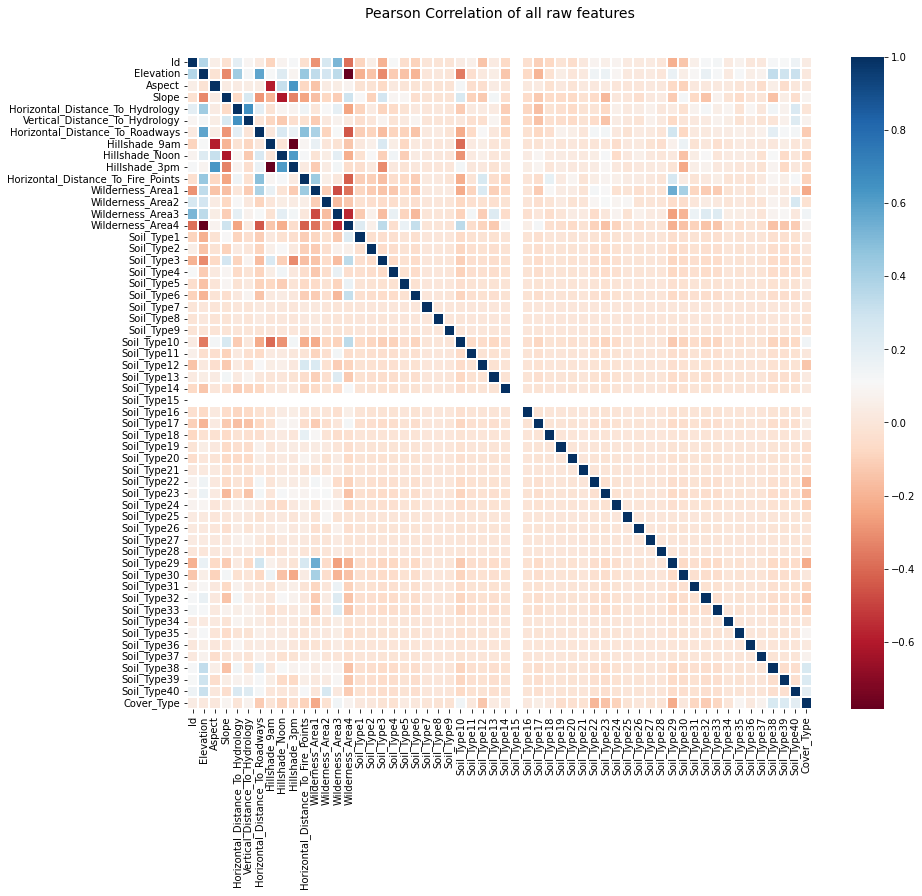

In [18]:
# Plot Pearson Correlation of all features
plt.figure(figsize=(14,12))
sns.heatmap(df_train.corr(),linewidths=0.1,vmax=1.0, 
            square=False, cmap=plt.cm.RdBu, linecolor='white', annot=False)
plt.title('Pearson Correlation of all raw features', y=1.05, size=14);

In [39]:
print('We cannot see much on this plot')

We cannot see much on this plot


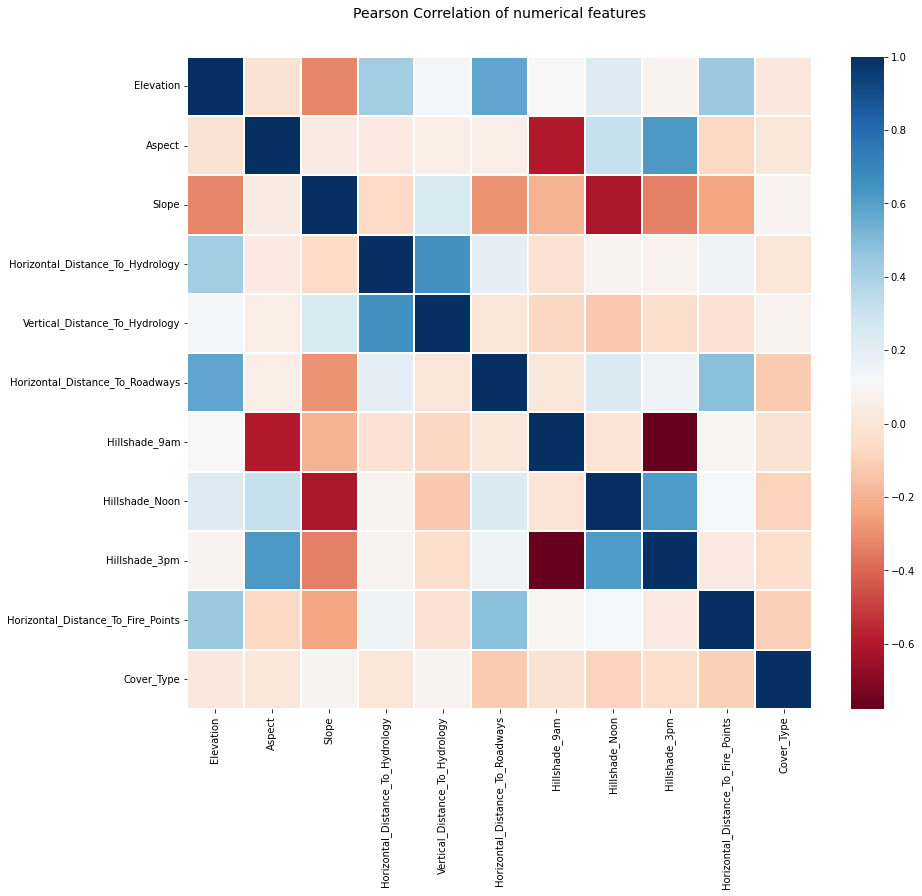

In [19]:
# Plot Pearson Correlation of numerical features
plt.figure(figsize=(14,12))
sns.heatmap(df_train[num_columns+['Cover_Type']].corr(),linewidths=0.1,vmax=1.0, 
            square=False, cmap=plt.cm.RdBu, linecolor='white', annot=False)
plt.title('Pearson Correlation of numerical features', y=1.05, size=14);

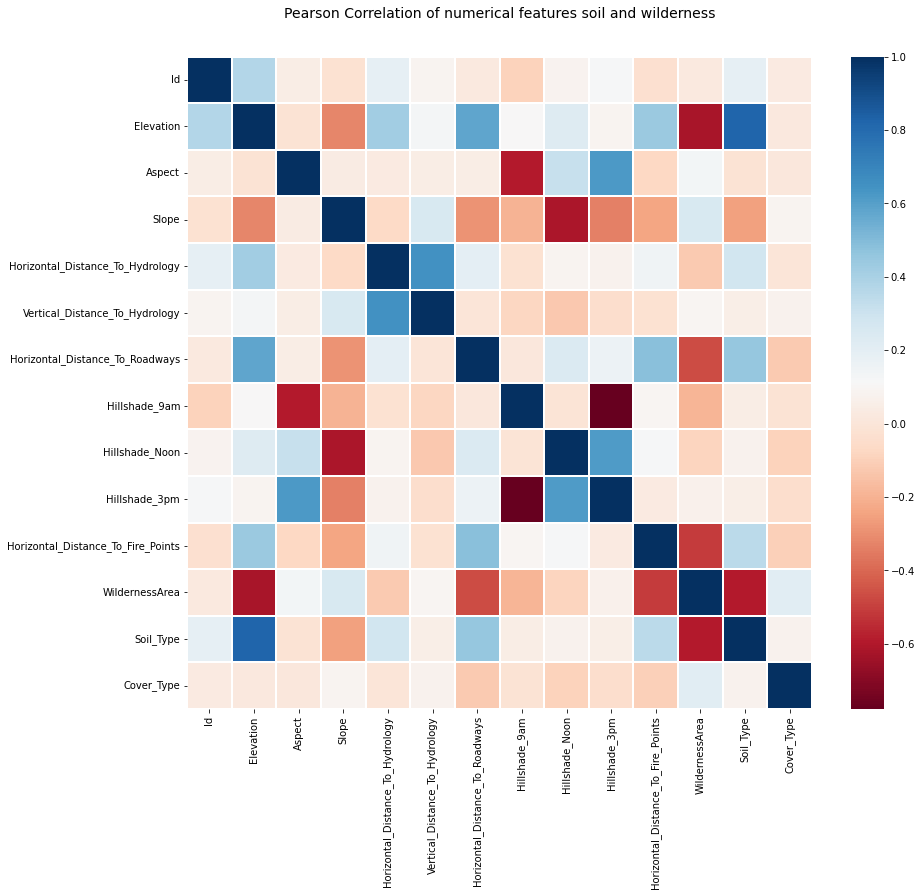

In [36]:
# Plot Pearson Correlation of numerical features + soil and wilderness

df_reverse = reverse_one_hot_encode(df_train, columns_of_interest=wilder_columns, new_column_name='WildernessArea')
df_reverse = reverse_one_hot_encode(df_reverse, columns_of_interest=soil_columns, new_column_name='Soil_Type')

plt.figure(figsize=(14,12))
sns.heatmap(df_reverse.corr(),linewidths=0.1,vmax=1.0, 
            square=False, cmap=plt.cm.RdBu, linecolor='white', annot=False)
plt.title('Pearson Correlation of numerical features soil and wilderness', y=1.05, size=14);

In [8]:
print('Not very relevant to look at a correlation between the OrdinalEncoded WildernessArea/Soil_Type and the Cover_Type as both are arbitrary OrdinalEncoded...')
print('This plot says that Elevation is barely correlated to Cover_Type - which is not true, as we are going to see now')

Not very relevant to look at a correlation between the OrdinalEncoded WildernessArea/Soil_Type and the Cover_Type as both are arbitrary OrdinalEncoded...
This plot says that Elevation is barely correlated to Cover_Type - which is not true, as we are going to see now


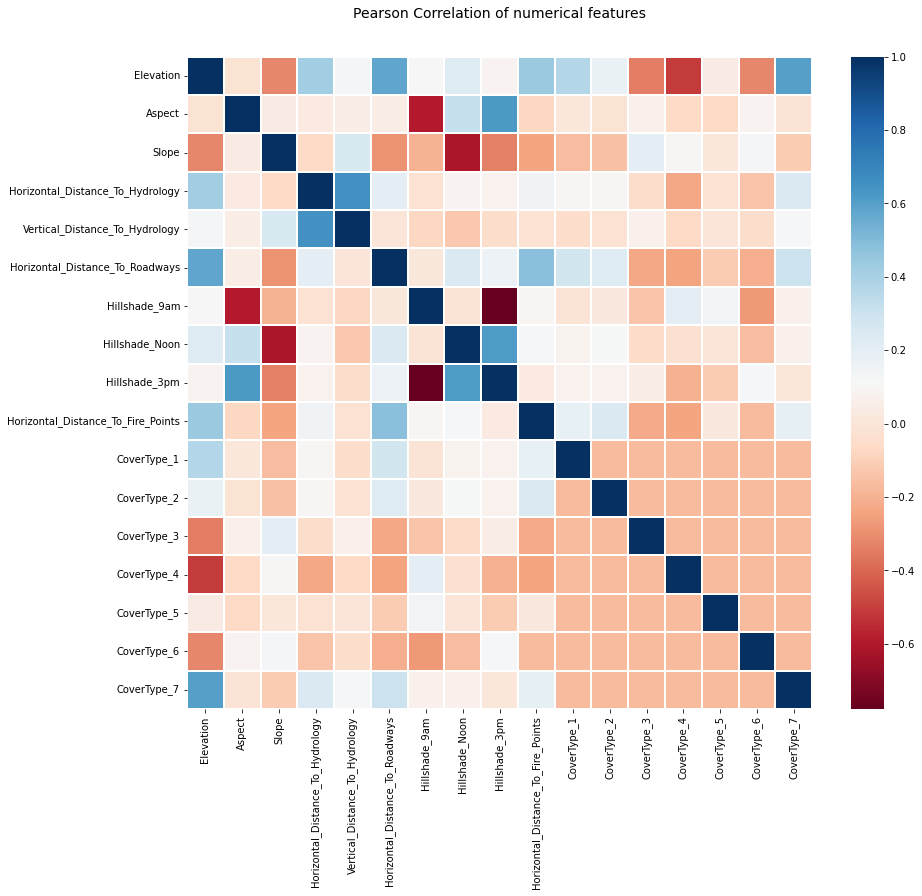

In [7]:
# OneHotEncode the target to better see correlations
df_train_reshaped = one_hot_encode(df_train, column_of_interest='Cover_Type', new_columns_prefix='CoverType')

# Plot Pearson Correlation of numerical features
plt.figure(figsize=(14,12))
sns.heatmap(df_train_reshaped[num_columns + [col for col in df_train_reshaped.columns if 'Cover' in col]].corr(),linewidths=0.1,vmax=1.0, 
            square=False, cmap=plt.cm.RdBu, linecolor='white', annot=False)
plt.title('Pearson Correlation of numerical features', y=1.05, size=14);

In [11]:
print('We clearly see that Elevation and CoverType are strongly correlated')
print('We also see that CoverTypes 3, 4 and 6 are pretty close to each other, aswell as 1 and 2')

We clearly see that Elevation and CoverType are strongly correlated
We also see that CoverTypes 3, 4 and 6 are pretty close to each other, aswell as 1 and 2


### Numerical features analysis

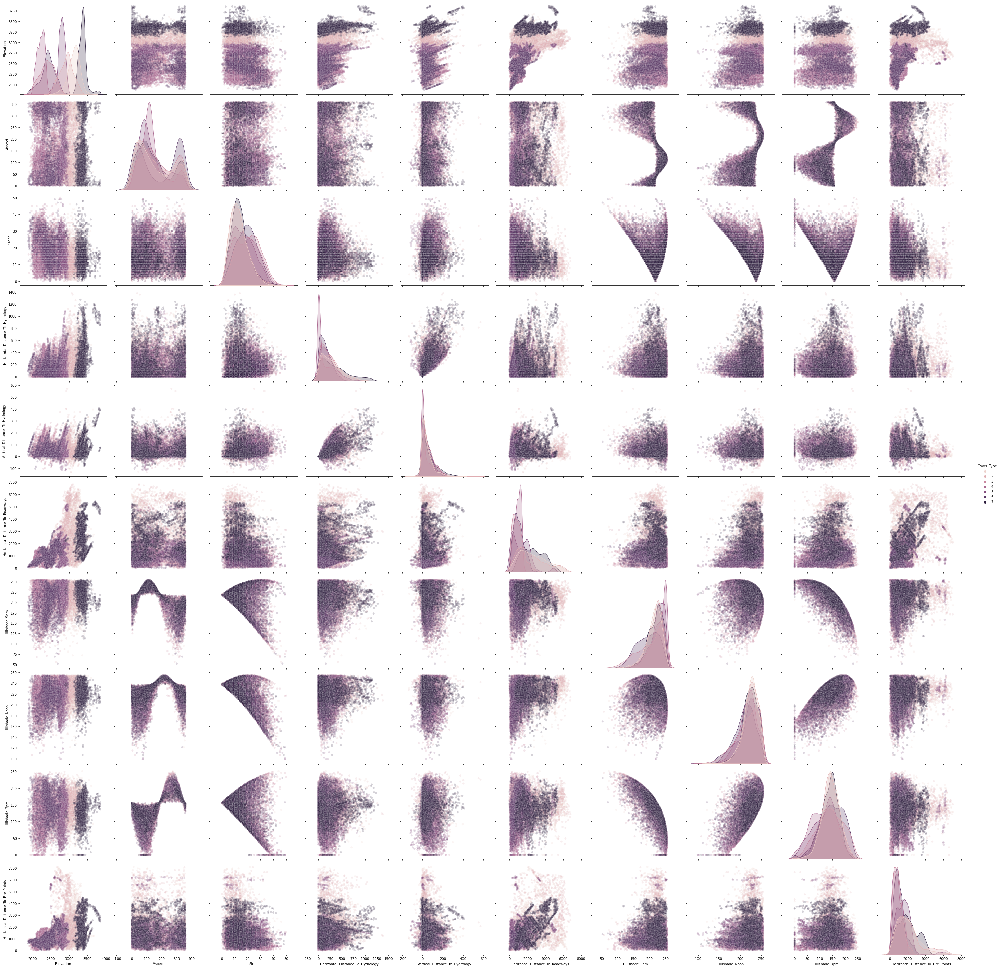

In [21]:
sns.pairplot(data=df_train, vars=num_columns, hue='Cover_Type', plot_kws={'alpha': 0.2}, height=4);	

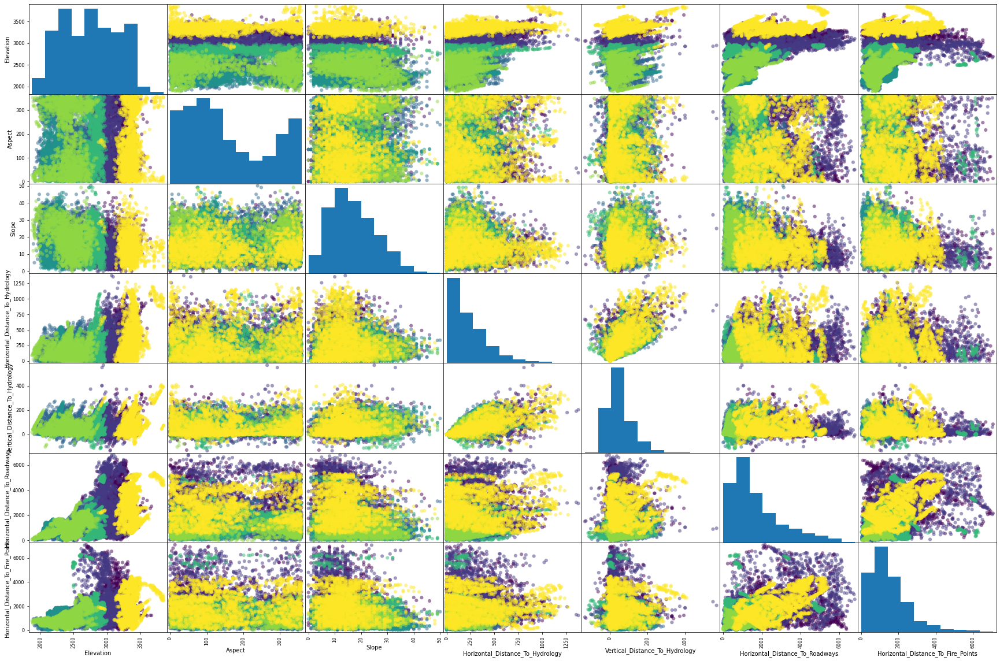

In [22]:
num_columns_ = [col for col in num_columns if 'Hillshade' not in col]
_ = pd.plotting.scatter_matrix(df_train[num_columns_], c = df_train['Cover_Type'], figsize = [30, 20], s=150)

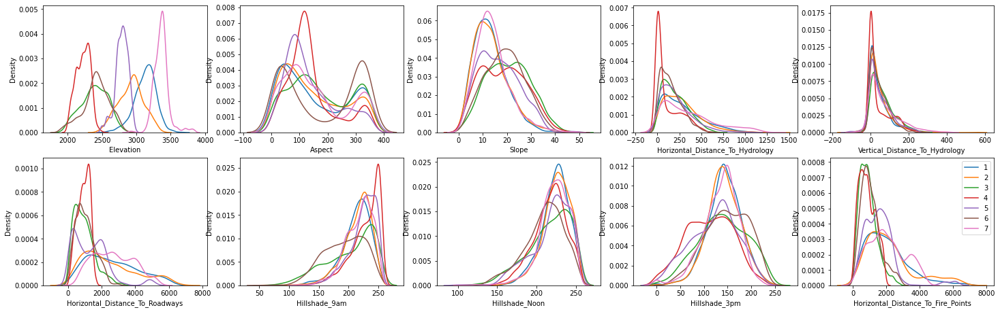

In [4]:
# Plot numerical features with label-breakdown
plot_features_labelbreakdown(df_train, columns_of_interest=num_columns)

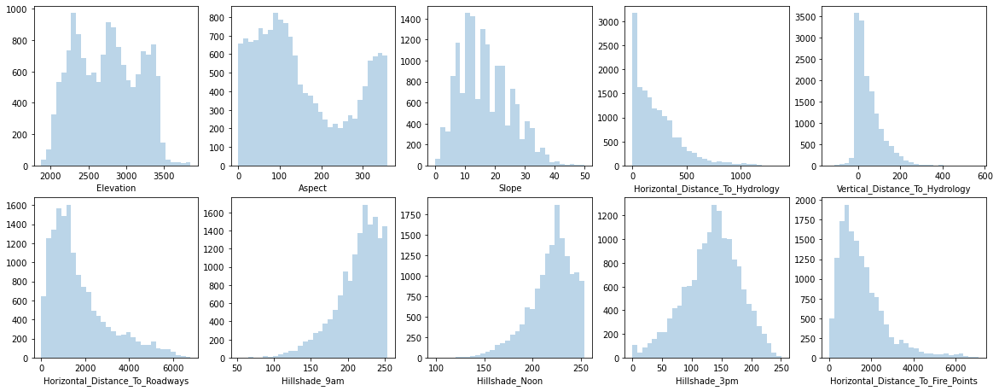

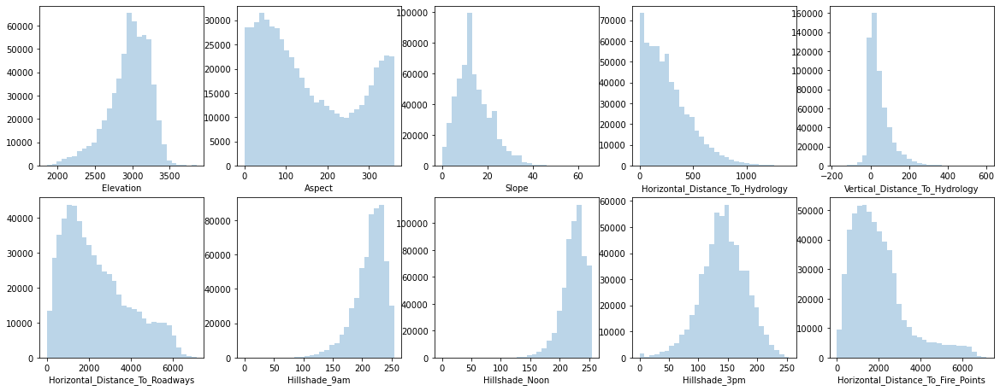

In [24]:
# Compare numerical features distribution between training and testing sets
plot_features_hist(df_train, columns_of_interest=num_columns)
plot_features_hist(df_test, columns_of_interest=num_columns)

In [25]:
print('--> Rather similar distributions between the 2 sets, except for Elevation and Horizontal_Distance_To_Hydrology')

--> Rather similar distributions between the 2 sets, except for Elevation and Horizontal_Distance_To_Hydrology


### Categorical variables

First, let's see the repartition of WildernessArea and Soil_Type between :
1. The different labels (of the training set)
2. The training set and the testing set

In [26]:
# First, labels breakdown
soil_columns = [col for col in df_train.columns if 'Soil' in col]
wilder_columns = [col for col in df_train.columns if 'Wilderness' in col]

In [27]:
# WildernessAreas by label
wilder_train = pivot_binary_features(df=df_train, new_columns='Cover_Type', new_index='Wilder_Type', feature_key='Wilderness')
wilder_train

Cover_Type,1,2,3,4,5,6,7,total
Wilder_Type,,,,,,,,
1,1068.0,1105.0,0.0,0.0,862.0,0.0,533.0,3568.0
2,237.0,85.0,0.0,0.0,0.0,0.0,247.0,569.0
3,855.0,949.0,856.0,0.0,1298.0,964.0,1380.0,6302.0
4,0.0,21.0,1304.0,2160.0,0.0,1196.0,0.0,4681.0


In [28]:
print('We clearly see that Wilderness is an important factor. For example, if Wilderness_Area2 it can only be [1, 2, 7]')

We clearly see that Wilderness is an important factor. For example, if Wilderness_Area2 it can only be [1, 2, 7]


In [29]:
# Soil_Type by label
soil_train = pivot_binary_features(df=df_train, new_columns='Cover_Type', new_index='Soil_Type', feature_key='Soil')
soil_train

Cover_Type,1,2,3,4,5,6,7,total
Soil_Type,,,,,,,,
1,0.0,0.0,110.0,135.0,0.0,94.0,0.0,339.0
2,0.0,7.0,305.0,95.0,62.0,158.0,0.0,627.0
3,0.0,11.0,169.0,803.0,0.0,23.0,0.0,1006.0
4,1.0,31.0,448.0,131.0,141.0,76.0,11.0,839.0
5,0.0,0.0,64.0,36.0,0.0,81.0,0.0,181.0
6,0.0,10.0,250.0,262.0,0.0,157.0,0.0,679.0
7,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
8,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
9,1.0,3.0,0.0,0.0,0.0,0.0,0.0,4.0


In [30]:
print('Similarly, Soil_Type is an important factor. For example, Soil_Type37 seems to imply label=7')

Similarly, Soil_Type is an important factor. For example, Soil_Type37 seems to imply label=7


In [31]:
# Then, training set/testing set breakdown
# Soil_Type by dataset (with ratio)

wilder_rep = repartition_binary_features(df_train, df_test, feature_key='Wilderness')
wilder_rep

,Wilderness0,Wilderness1,Wilderness2,Wilderness3
train,3568.0000,569.0000,6302.0000,4681.0000
test,260796.0000,29884.0000,253364.0000,36968.0000
train_ratio,0.2360,0.0376,0.4168,0.3096
test_ratio,0.4489,0.0514,0.4361,0.0636


In [32]:
print('We clearly see that the dataset split (between train and test) is not homogenous') 

We clearly see that the dataset split (between train and test) is not homogenous


In [33]:
# Soil_Type by dataset (with ratio)
soil_rep = repartition_binary_features(df_train, df_test, feature_key='Soil')
soil_rep

,Soil0,Soil1,Soil2,Soil3,Soil4,Soil5,Soil6,Soil7,Soil8,Soil9,...,Soil30,Soil31,Soil32,Soil33,Soil34,Soil35,Soil36,Soil37,Soil38,Soil39
train,339.0000,627.0000,1006.0000,839.0000,181.0000,679.0000,1.0000,2.0000,4.0000,2096.0000,...,304.0000,663.0000,619.0000,18.0000,103.0000,14.0000,32.0000,744.0000,634.0000,456.0000
test,3031.0000,7525.0000,4823.0000,12396.0000,1597.0000,6575.0000,105.0000,179.0000,1147.0000,32634.0000,...,25666.0000,52519.0000,45154.0000,1611.0000,1891.0000,119.0000,298.0000,15573.0000,13806.0000,8750.0000
train_ratio,0.0224,0.0415,0.0665,0.0555,0.0120,0.0449,0.0001,0.0001,0.0003,0.1386,...,0.0201,0.0438,0.0409,0.0012,0.0068,0.0009,0.0021,0.0492,0.0419,0.0302
test_ratio,0.0052,0.0130,0.0083,0.0213,0.0027,0.0113,0.0002,0.0003,0.0020,0.0562,...,0.0442,0.0904,0.0777,0.0028,0.0033,0.0002,0.0005,0.0268,0.0238,0.0151


In [34]:
print('Soil_Types confirm that the dataset split (between train and test) is not homogenous') 

Soil_Types confirm that the dataset split (between train and test) is not homogenous


In [35]:
""" def categorical_post_mean(x):
        p = (x.values)*type_ratio
        p = p/p.sum()*x.sum() + 10*type_ratio
        return p/p.sum()

type_ratio = np.array([1/7]*7)
type_ratio1 = np.array([0.37053, 0.49681, 0.05936, 0.00103, 0.01295, 0.02687, 0.03242])

tmp1 = pd.DataFrame(piv.apply(categorical_post_mean, axis=1).tolist()).reset_index()
tmp1["index"] = piv.sum(axis=1).index
tmp1.columns = ["Wilder_Type"] + ["Wilder_prob_ctype_{}".format(i) for i in range(1, 8)]
tmp1["Wilder_Type_count"] = piv.sum(axis=1).values
total_df["Wilder_Type"] = (total_df.filter(regex="Wilder") * np.arange(1, 5)).sum(axis=1)
total_df = total_df.merge(tmp, on="Wilder_Type", how="left")

"""

' def categorical_post_mean(x):\n        p = (x.values)*type_ratio\n        p = p/p.sum()*x.sum() + 10*type_ratio\n        return p/p.sum()\n\ntype_ratio = np.array([1/7]*7)\ntype_ratio1 = np.array([0.37053, 0.49681, 0.05936, 0.00103, 0.01295, 0.02687, 0.03242])\n\ntmp1 = pd.DataFrame(piv.apply(categorical_post_mean, axis=1).tolist()).reset_index()\ntmp1["index"] = piv.sum(axis=1).index\ntmp1.columns = ["Wilder_Type"] + ["Wilder_prob_ctype_{}".format(i) for i in range(1, 8)]\ntmp1["Wilder_Type_count"] = piv.sum(axis=1).values\ntotal_df["Wilder_Type"] = (total_df.filter(regex="Wilder") * np.arange(1, 5)).sum(axis=1)\ntotal_df = total_df.merge(tmp, on="Wilder_Type", how="left")\n\n'

In [34]:
df_soil = pd.DataFrame(df_train[soil_columns].sum(), columns=['sum'])
total = int(df_soil.sum())
df_soil['ratio'] = round((df_soil['sum'] / total)*100, 1)
df_soil.sort_values('sum', ascending=False)

,sum,ratio
Soil_Type10,2096,13.9
Soil_Type29,1308,8.7
Soil_Type3,1006,6.7
Soil_Type4,839,5.5
Soil_Type38,744,4.9
Soil_Type23,742,4.9
Soil_Type30,736,4.9
Soil_Type6,679,4.5
Soil_Type32,663,4.4
Soil_Type17,640,4.2


In [40]:
little_soil = list(df_soil[df_soil['ratio']<=2].index)
df_soil.loc[little_soil, 'ratio'].sum()

11.699999999999998

In [41]:
soils = ['Soil_Type10', 'Soil_Type29', 'Soil_Type3', 'Soil_Type4', 'Soil_Type38', 'Soil_Type23', 'Soil_Type6', 'Soil_Type30']

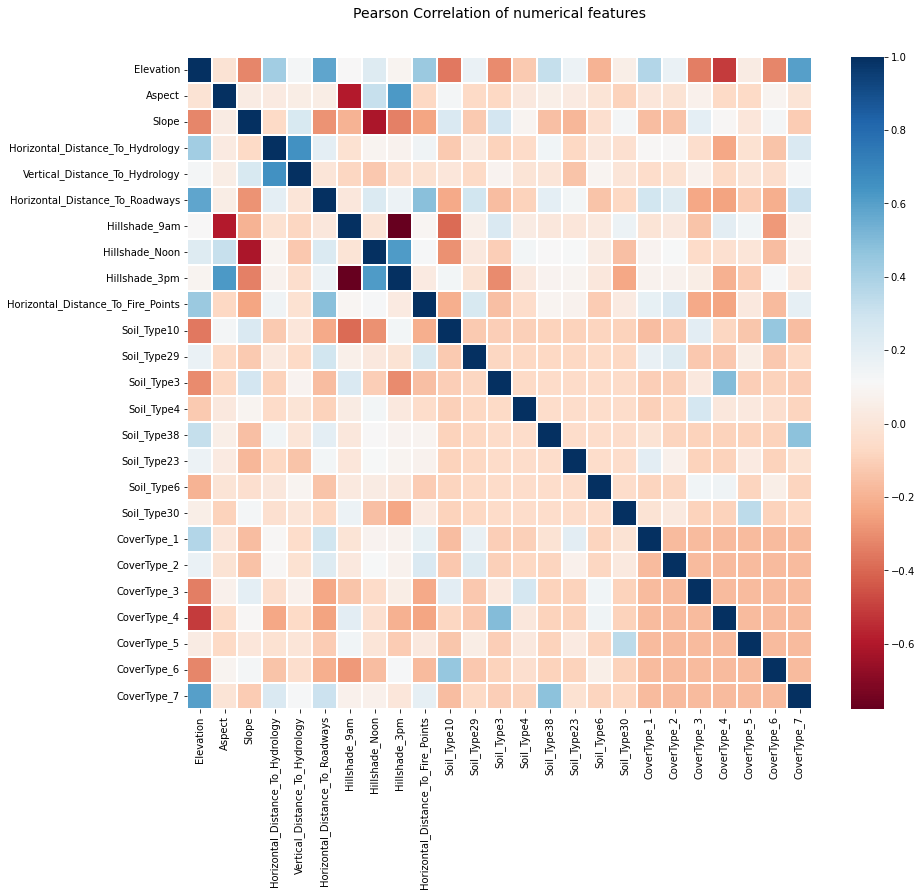

In [43]:
# OneHotEncode the target to better see correlations
df_train_reshaped = one_hot_encode(df_train, column_of_interest='Cover_Type', new_columns_prefix='CoverType')

# Plot Pearson Correlation of numerical features
plt.figure(figsize=(14,12))
sns.heatmap(df_train_reshaped[num_columns + soils + [col for col in df_train_reshaped.columns if 'Cover' in col]].corr(),linewidths=0.1,vmax=1.0, 
            square=False, cmap=plt.cm.RdBu, linecolor='white', annot=False)
plt.title('Pearson Correlation of numerical features', y=1.05, size=14);

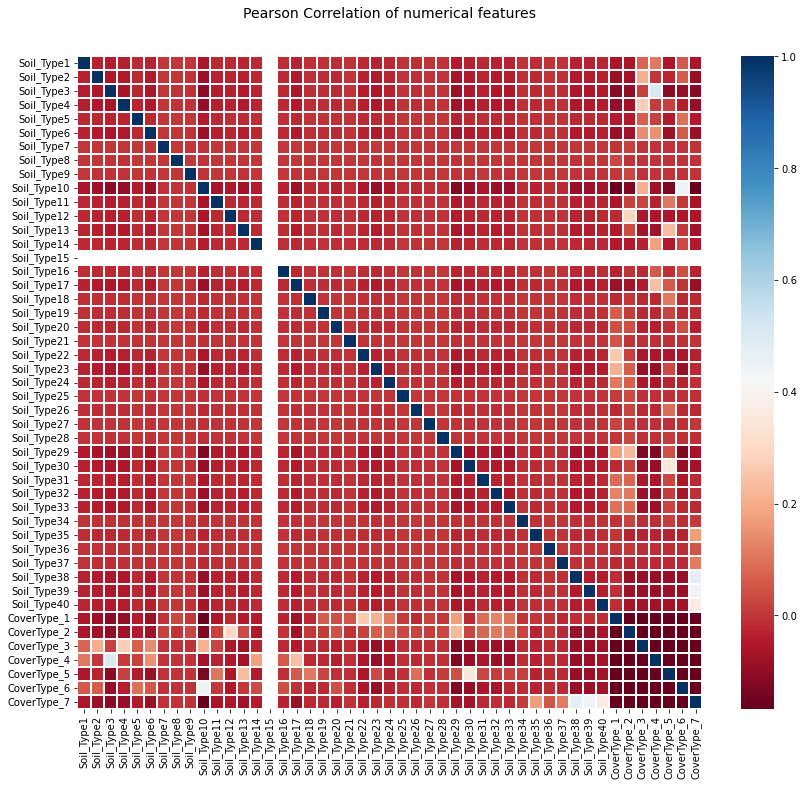

In [45]:
# OneHotEncode the target to better see correlations
df_train_reshaped = one_hot_encode(df_train, column_of_interest='Cover_Type', new_columns_prefix='CoverType')

# Plot Pearson Correlation of numerical features
plt.figure(figsize=(14,12))
sns.heatmap(df_train_reshaped[soil_columns + [col for col in df_train_reshaped.columns if 'Cover' in col]].corr(),linewidths=0.1,vmax=1.0, 
            square=False, cmap=plt.cm.RdBu, linecolor='white', annot=False)
plt.title('Pearson Correlation of numerical features', y=1.05, size=14);